In [1]:
import os, sys, platform
sys.path.append(os.path.dirname(os.getcwd()))

from env_constants import DATASET_ROOT, PYGARMENT_ROOT

if platform.system() == 'Linux':
    os.environ["PYOPENGL_PLATFORM"] = "egl"
os.environ["PYOPENGL_PLATFORM"] = "egl"
os.environ['MESA_GL_VERSION_OVERRIDE'] = '4.1' 
os.environ['MESA_GLSL_VERSION_OVERRIDE'] = '410'


import time
import random
from pprint import pprint
from glob import glob
import numpy as np
import pickle
import matplotlib.pyplot as plt
import cv2
from matplotlib.patches import FancyArrowPatch
import plotly.graph_objects as go


import pyrender

import pygarment as pyg
import trimesh
import PIL
from PIL import Image

from analysis_utils import visualize_meshes_plotly, v_id_map, plot_panel_info

In [2]:
GARMENT_ROOT_PATH = os.path.join(DATASET_ROOT, "GarmentCodeData_v2")
BODY_TYPE = "default_body"

MEAN_ALL_BODY_PATH = os.path.join(DATASET_ROOT, "neutral_body/mean_all.obj")
default_body_mesh = trimesh.load(MEAN_ALL_BODY_PATH)


garment_path_list = sorted(list(filter(
    os.path.isdir,
    glob(os.path.join(GARMENT_ROOT_PATH, "*", BODY_TYPE, "*"))
)))]]

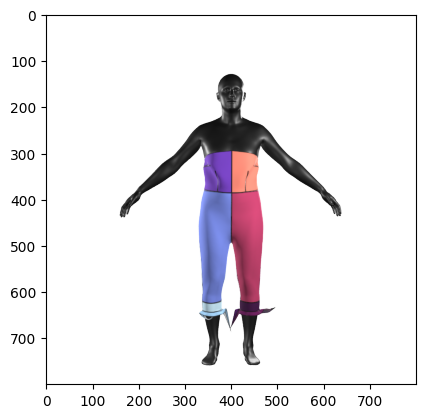

In [16]:
IDX = random.randint(0, len(garment_path_list) - 1)
IDX = 100365

garment_path = garment_path_list[IDX]
garment_id = os.path.basename(garment_path)

# ready pyrender meshes
body_material = pyrender.MetallicRoughnessMaterial(
    baseColorFactor=(0.0, 0.0, 0.0, 1.0),  # RGB color, Alpha
    metallicFactor=0.658,  # Range: [0.0, 1.0]
    roughnessFactor=0.5  # Range: [0.0, 1.0]
)
pyrender_body_mesh = pyrender.Mesh.from_trimesh(
    default_body_mesh,
    material=body_material
)
pass

simulated_garment_mesh = trimesh.load_mesh(
    os.path.join(garment_path, f"{garment_id}_sim.ply"),
    process=False
)
simulated_garment_mesh.vertices = simulated_garment_mesh.vertices / 100
tex_image = PIL.Image.open(os.path.join(garment_path, f"{garment_id}_texture.png"))
texture = trimesh.visual.TextureVisuals(
    simulated_garment_mesh.visual.uv,
    image=tex_image
)
simulated_garment_mesh.visual = texture


material = simulated_garment_mesh.visual.material.to_pbr()
material.baseColorFactor = [1., 1., 1., 1.]
material.doubleSided = True  # color both face sides  

white_back = Image.new(
    'RGBA', material.baseColorTexture.size, color=(255, 255, 255, 255)
)
white_back.paste(material.baseColorTexture)
material.baseColorTexture = white_back.convert('RGB')

simulated_garment_mesh.visual.material = material


pyrender_garm_mesh = pyrender.Mesh.from_trimesh(
    simulated_garment_mesh, smooth=True
) 

scene = pyrender.Scene(bg_color=(1., 1., 1., 0.))

scene.add(pyrender_garm_mesh)
scene.add(pyrender_body_mesh)

camera = pyrender.PerspectiveCamera(yfov=np.pi / 6)
camera_location = [0, 0.97, 4.15]

cam_T = np.array(camera_location)
cam_R = np.eye(3)

cam_pose = np.eye(4)
cam_pose[:3, :3] = cam_R
cam_pose[:3, 3] = cam_T


cam_direction = -cam_R[:, 2]
arrow_length = 0.3

arrow_start = cam_T
arrow_end = cam_T + arrow_length * cam_direction


scene.add(camera, pose=cam_pose)


# create_lights(scene, intensity=80.)

intensity = 80.
light_positions = [
    np.array([1.60614, 1.5341, 1.23701]),
    np.array([1.31844, 1.92831, -2.52238]),
    np.array([-2.80522, 1.2594, 2.34624]),
    np.array([0.160261, 1.81789, 3.52215]),
    np.array([-2.65752, 1.41194, -1.26328])
]
light_colors = [
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0]
]

# Add lights to the scene
for i in range(5):
    light = pyrender.PointLight(color=light_colors[i], intensity=intensity)
    light_pose = np.eye(4)
    light_pose[:3, 3] = light_positions[i]
    scene.add(light, pose=light_pose)

# camera_node = list(filter(
#     lambda x : x.camera is not None,
#     scene.get_nodes()
# ))[-1]


renderer = pyrender.OffscreenRenderer(
    viewport_width  = 800,
    viewport_height = 800
)

flags = pyrender.RenderFlags.RGBA | pyrender.RenderFlags.SKIP_CULL_FACES
color, depth = renderer.render(scene, flags=flags)




renderer.delete()

plt.imshow(color)

fig = visualize_meshes_plotly(
    [
        default_body_mesh,
        simulated_garment_mesh,
    ],
    show_edges = False,
    show = False,
)

fig.add_trace(go.Scatter3d(
    x=[camera_location[0], camera_location[0] + cam_direction[0]],
    y=[camera_location[1], camera_location[1] + cam_direction[1]],
    z=[camera_location[2], camera_location[2] + cam_direction[2]],
    mode='lines',
    line=dict(color='red', width=5),
    name='Camera Direction'
))

# Add a point for camera position
fig.add_trace(go.Scatter3d(
    x=[camera_location[0]],
    y=[camera_location[1]],
    z=[camera_location[2]],
    mode='markers',
    marker=dict(size=8, color='blue'),
    name='Camera Position'
))

fig.show()

In [17]:
arrow_start

array([0.  , 0.97, 4.15])

In [ ]:
IDX = random.randint(0, len(garment_path_list) - 1)
IDX = 100365

garment_path = garment_path_list[IDX]
garment_id = os.path.basename(garment_path)

# ready pyrender meshes
body_material = pyrender.MetallicRoughnessMaterial(
    baseColorFactor=(0.0, 0.0, 0.0, 1.0),  # RGB color, Alpha
    metallicFactor=0.658,  # Range: [0.0, 1.0]
    roughnessFactor=0.5  # Range: [0.0, 1.0]
)
pyrender_body_mesh = pyrender.Mesh.from_trimesh(
    default_body_mesh,
    material=body_material
)


simulated_garment_mesh = trimesh.load_mesh(
    os.path.join(garment_path, f"{garment_id}_sim.ply"),
    process=False
)
simulated_garment_mesh.vertices = simulated_garment_mesh.vertices / 100
tex_image = PIL.Image.open(os.path.join(garment_path, f"{garment_id}_texture.png"))
texture = trimesh.visual.TextureVisuals(
    simulated_garment_mesh.visual.uv,
    image=tex_image
)
simulated_garment_mesh.visual = texture

material = simulated_garment_mesh.visual.material.to_pbr()
material.baseColorFactor = [1., 1., 1., 1.]
material.doubleSided = True  # color both face sides  

white_back = Image.new(
    'RGBA', material.baseColorTexture.size, color=(255, 255, 255, 255)
)
white_back.paste(material.baseColorTexture)
material.baseColorTexture = white_back.convert('RGB')

simulated_garment_mesh.visual.material = material


pyrender_garm_mesh = pyrender.Mesh.from_trimesh(
    simulated_garment_mesh, smooth=True
) 

scene = pyrender.Scene(bg_color=(1., 1., 1., 0.))

scene.add(pyrender_garm_mesh)
scene.add(pyrender_body_mesh)

camera = pyrender.PerspectiveCamera(yfov=np.pi / 6)
camera_location = [0, 0.97, 4.15]

cam_T = np.array(camera_location)
cam_R = np.eye(3)

cam_pose = np.eye(4)
cam_pose[:3, :3] = cam_R
cam_pose[:3, 3] = cam_T


cam_direction = -cam_R[:, 2]
arrow_length = 0.3

arrow_start = cam_T[0]
arrow_end = cam_T[0] + arrow_length * cam_direction


scene.add(camera, pose=cam_pose)


# create_lights(scene, intensity=80.)

intensity = 80.
light_positions = [
    np.array([1.60614, 1.5341, 1.23701]),
    np.array([1.31844, 1.92831, -2.52238]),
    np.array([-2.80522, 1.2594, 2.34624]),
    np.array([0.160261, 1.81789, 3.52215]),
    np.array([-2.65752, 1.41194, -1.26328])
]
light_colors = [
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0]
]

# Add lights to the scene
for i in range(5):
    light = pyrender.PointLight(color=light_colors[i], intensity=intensity)
    light_pose = np.eye(4)
    light_pose[:3, 3] = light_positions[i]
    scene.add(light, pose=light_pose)

# camera_node = list(filter(
#     lambda x : x.camera is not None,
#     scene.get_nodes()
# ))[-1]


renderer = pyrender.OffscreenRenderer(
    viewport_width  = 800,
    viewport_height = 800
)

flags = pyrender.RenderFlags.RGBA | pyrender.RenderFlags.SKIP_CULL_FACES
color, depth = renderer.render(scene, flags=flags)

renderer.delete()


plt.imshow(color)
plt.show()

fig = visualize_meshes_plotly(
    [
        default_body_mesh,
        simulated_garment_mesh,
    ],
    show_edges = False,
    show = False,
)

fig.add_trace(go.Scatter3d(
    x=[camera_location[0], camera_location[0] + cam_direction[0]],
    y=[camera_location[1], camera_location[1] + cam_direction[1]],
    z=[camera_location[2], camera_location[2] + cam_direction[2]],
    mode='lines',
    line=dict(color='red', width=5),
    name='Camera Direction'
))

# Add a point for camera position
fig.add_trace(go.Scatter3d(
    x=[camera_location[0]],
    y=[camera_location[1]],
    z=[camera_location[2]],
    mode='markers',
    marker=dict(size=8, color='blue'),
    name='Camera Position'
))

fig.show()

In [ ]:
IDX = random.randint(0, len(garment_path_list) - 1)
IDX = 100365

garment_path = garment_path_list[IDX]


garment_id = os.path.basename(garment_path)

# Read Mesh
simulated_garment_mesh = trimesh.load_mesh(
    os.path.join(garment_path, f"{garment_id}_sim.ply"),
    process=False
)
simulated_garment_mesh.vertices = simulated_garment_mesh.vertices / 100

tex_image = PIL.Image.open(os.path.join(garment_path, f"{garment_id}_texture.png"))
texture = trimesh.visual.TextureVisuals(
    simulated_garment_mesh.visual.uv,
    image=tex_image
)
simulated_garment_mesh.visual = texture

# ready pyrender meshes
body_material = pyrender.MetallicRoughnessMaterial(
    baseColorFactor=(0.0, 0.0, 0.0, 1.0),  # RGB color, Alpha
    metallicFactor=0.658,  # Range: [0.0, 1.0]
    roughnessFactor=0.5  # Range: [0.0, 1.0]
)
pyrender_body_mesh = pyrender.Mesh.from_trimesh(default_body_mesh, material=body_material)


material = simulated_garment_mesh.visual.material.to_pbr()
material.baseColorFactor = [1., 1., 1., 1.]
material.doubleSided = True  # color both face sides  

white_back = Image.new('RGBA', material.baseColorTexture.size, color=(255, 255, 255, 255))
white_back.paste(material.baseColorTexture)
material.baseColorTexture = white_back.convert('RGB')  

simulated_garment_mesh.visual.material = material

pyrender_garm_mesh = pyrender.Mesh.from_trimesh(
    simulated_garment_mesh, smooth=True
) 

# for side in render_props["sides"]:

scene = pyrender.Scene(bg_color=(1., 1., 1., 0.))

scene.add(pyrender_garm_mesh)
scene.add(pyrender_body_mesh)

# create_camera(
#     pyrender,
#     pyrender_body_mesh, scene, side,
#     camera_location=render_props["front_camera_location"]
# )

camera = pyrender.PerspectiveCamera(yfov=np.pi / 6)
camera_location = [0, 0.97, 4.15]
camera_pose = np.array([
    [1.0, 0.0, 0.0, camera_location[0]],
    [0.0, 1.0, 0.0, camera_location[1]],
    [0.0, 0.0, 1.0, camera_location[2]],
    [0.0, 0.0, 0.0, 1.0]
])
scene.add(camera, pose=camera_pose)


# create_lights(scene, intensity=80.)

intensity = 80.
light_positions = [
    np.array([1.60614, 1.5341, 1.23701]),
    np.array([1.31844, 1.92831, -2.52238]),
    np.array([-2.80522, 1.2594, 2.34624]),
    np.array([0.160261, 1.81789, 3.52215]),
    np.array([-2.65752, 1.41194, -1.26328])
]
light_colors = [
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0],
    [1.0, 1.0, 1.0]
]

# Add lights to the scene
for i in range(5):
    light = pyrender.PointLight(color=light_colors[i], intensity=intensity)
    light_pose = np.eye(4)
    light_pose[:3, 3] = light_positions[i]
    scene.add(light, pose=light_pose)

# camera_node = list(filter(
#     lambda x : x.camera is not None,
#     scene.get_nodes()
# ))[-1]


renderer = pyrender.OffscreenRenderer(
    viewport_width  = 800,
    viewport_height = 800
)

flags = pyrender.RenderFlags.RGBA | pyrender.RenderFlags.SKIP_CULL_FACES
color, depth = renderer.render(scene, flags=flags)




renderer.delete()

plt.imshow(color)

# rendered_image_dict[side] = Image.fromarray(color)
# depth_image_dict[side] = depth

# view_matrix = np.linalg.inv(scene.get_pose(camera_node))
# proj_matrix = camera_node.camera.get_projection_matrix(*render_props["resolution"])

# vertices_homog = np.hstack([simulated_garment_mesh.vertices, np.ones((simulated_garment_mesh.vertices.shape[0], 1))])

# view_proj = proj_matrix @ view_matrix
# projected = vertices_homog @ view_proj.T

# z_coords = projected[:, 2].copy()
# projected = projected[:, :3] / projected[:, 3:4]

# pixel_coords = np.zeros((projected.shape[0], 2))
# pixel_coords[:, 0] = (projected[:, 0] + 1.0) * render_props["resolution"][0] / 2.0
# pixel_coords[:, 1] = render_props["resolution"][1] - (projected[:, 1] + 1.0) * render_props["resolution"][1] / 2.0

# px = np.clip(pixel_coords[:, 0].astype(int), 0, render_props["resolution"][0] - 1)
# py = np.clip(pixel_coords[:, 1].astype(int), 0, render_props["resolution"][1] - 1)

# THRESHOLD = 0.09
# visibility_mask = (z_coords > 0) & \
#             (pixel_coords[:, 0] >= 0) & (pixel_coords[:, 0] < render_props["resolution"][0]) & \
#             (pixel_coords[:, 1] >= 0) & (pixel_coords[:, 1] < render_props["resolution"][1]) & \
#             (z_coords + THRESHOLD < depth[py, px])
#             # (depth[py, px] - THRESHOLD < z_coords) & (depth[py, px] + THRESHOLD > z_coords)

# projected_vertex_pose_dict[side] = pixel_coords
# vertex_visibility_mask_dict[side] = visibility_mask

# renderer.delete()



# FIGLEN = 10
# NROWS = 3
# NCOLS = len(vertex_visibility_mask_dict.keys())
# plt.figure(figsize=(FIGLEN * NCOLS, FIGLEN * NROWS))
# for i, side in enumerate(vertex_visibility_mask_dict.keys()):
# plt.subplot(NROWS, NCOLS, i + 1)
# plt.imshow(rendered_image_dict[side])
# plt.tight_layout()
# vis_seam_pixel_coord = projected_vertex_pose_dict[side][
#     np.logical_and(
#         np.array(list(stitch_vertex_mask_dict.values())).sum(axis=0).astype(bool),
#         vertex_visibility_mask_dict[side]
#     )
# ]
# plt.scatter(
#     vis_seam_pixel_coord[:, 0],
#     vis_seam_pixel_coord[:, 1],
#     c="red",
#     s=1, alpha=0.5
# )

# plt.subplot(NROWS, NCOLS, i + 1 + NCOLS)
# plt.imshow(rendered_image_dict[side])
# plt.tight_layout()

# seam_pixel_coord = projected_vertex_pose_dict[side][
#     np.array(list(stitch_vertex_mask_dict.values())).sum(axis=0).astype(bool)
# ]
# plt.scatter(
#     seam_pixel_coord[:, 0],
#     seam_pixel_coord[:, 1],
#     c="red",
#     s=0.5, alpha=0.5
# )

# plt.subplot(NROWS, NCOLS, i + 1 + NCOLS * 2)
# plt.imshow(rendered_image_dict[side])
# plt.tight_layout()

# plt.show()


